In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
#загрузка датасета
df = pd.read_csv('nyc_taxi.csv', engine='python', parse_dates=['timestamp'])
df

,timestamp,value
0,2014-07-01 00:00:00,10844
1,2014-07-01 00:30:00,8127
2,2014-07-01 01:00:00,6210
3,2014-07-01 01:30:00,4656
4,2014-07-01 02:00:00,3820
...,...,...
10315,2015-01-31 21:30:00,24670
10316,2015-01-31 22:00:00,25721
10317,2015-01-31 22:30:00,27309
10318,2015-01-31 23:00:00,26591


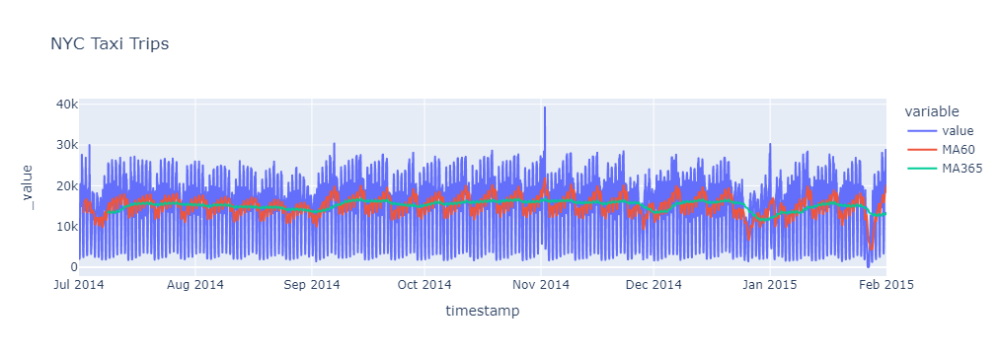

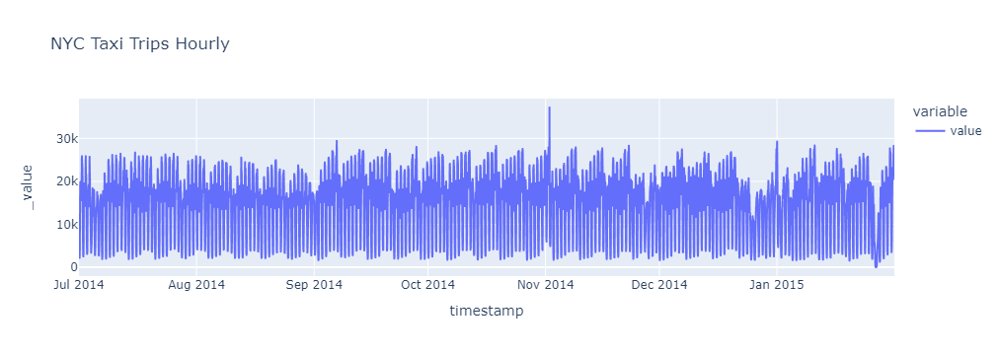

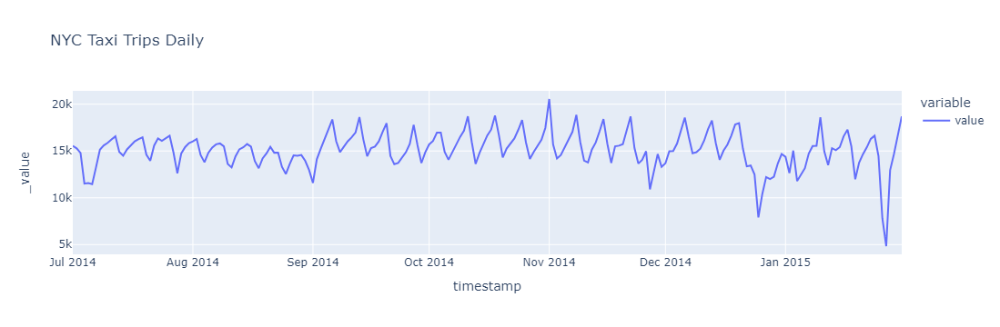

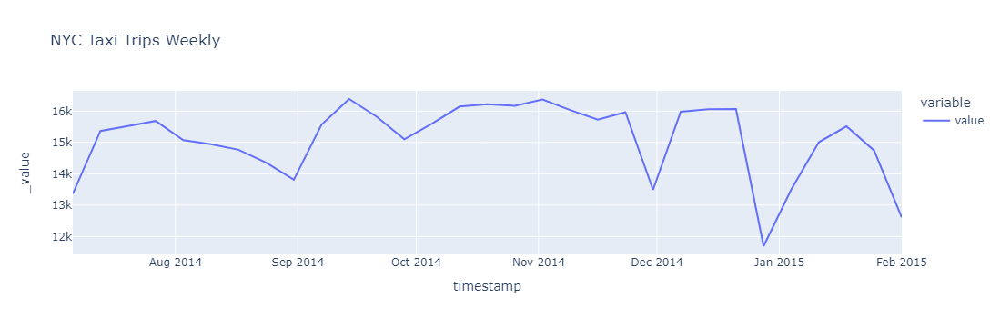

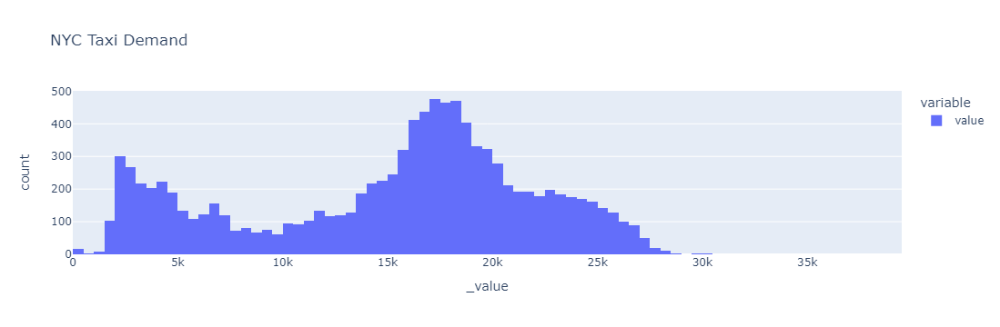

In [4]:
#обнаружение аномалий без учителя через isolation forest
#построение графика с трендами
df['MA60'] = df['value'].rolling(60).mean()
df['MA365'] = df['value'].rolling(365).mean()


fig = px.line(df, x="timestamp", y=['value', 'MA60', 'MA365'], title='NYC Taxi Trips')
fig.show()
df.drop(['MA60', 'MA365'], axis=1, inplace=True) #удаляем лишнее из датафрейма

#строим графики с фильтрацией по промежуткам времени
dfHours = df.set_index('timestamp').resample('H').mean()
dfDays = df.set_index('timestamp').resample('D').mean()
dfWeeks = df.set_index('timestamp').resample('W').mean()

fig = px.line(dfHours, y=['value'], title='NYC Taxi Trips Hourly')
fig.show()

fig = px.line(dfDays, y=['value'], title='NYC Taxi Trips Daily')
fig.show()

fig = px.line(dfWeeks, y=['value'], title='NYC Taxi Trips Weekly')
fig.show()

hist = px.histogram(df, x=['value'],  labels={'Demand', 'Density'}, title='NYC Taxi Demand')
hist.show()

In [5]:
#создаем дополнительные признаки из дат
df.set_index('timestamp', drop=True, inplace=True)

df['day'] = [i.day for i in df.index]
df['day_name'] = [i.day_name() for i in df.index]
df['day_of_year'] = [i.dayofyear for i in df.index]
df['week_of_year'] = [i.weekofyear for i in df.index]
df['hour'] = [i.hour for i in df.index]
df['is_weekday'] = [i.isoweekday() for i in df.index]
df.head()

,value,day,day_name,day_of_year,week_of_year,hour,is_weekday
timestamp,,,,,,,
2014-07-01 00:00:00,10844,1,Tuesday,182,27,0,2
2014-07-01 00:30:00,8127,1,Tuesday,182,27,0,2
2014-07-01 01:00:00,6210,1,Tuesday,182,27,1,2
2014-07-01 01:30:00,4656,1,Tuesday,182,27,1,2
2014-07-01 02:00:00,3820,1,Tuesday,182,27,2,2


In [6]:
#устанавливаем pycaret
#!pip install pycaret==2.3.0

In [6]:
#задаем сетап
from pycaret.anomaly import *
s = setup(df, session_id = 42,
          ordinal_features = {'day_name' : ['Monday', 'Tuesday', 'Wednesday', 'Thursday',
       'Friday','Sunday','Saturday',]},
          numeric_features=['is_weekday'])

,Description,Value
0,session_id,42
1,Original Data,"(10320, 7)"
2,Missing Values,False
3,Numeric Features,6
4,Categorical Features,1
5,Ordinal Features,True
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(10320, 7)"
9,CPU Jobs,-1


In [7]:
#создаем модель по заданию, смотрим параметры
threshold = 0.05 #порог по заданию
iforest = create_model('iforest', contamination=0.005, max_samples=0.7, n_estimators=200)

In [8]:
#обнаруживаем аномалии
iforest_results = assign_model(iforest)
iforest_results.head()

,value,day,day_name,day_of_year,week_of_year,hour,is_weekday,Anomaly,Anomaly_Score
timestamp,,,,,,,,,
2014-07-01 00:00:00,10844,1,Tuesday,182,27,0,2,1,0.008930
2014-07-01 00:30:00,8127,1,Tuesday,182,27,0,2,1,0.004587
2014-07-01 01:00:00,6210,1,Tuesday,182,27,1,2,0,-0.018929
2014-07-01 01:30:00,4656,1,Tuesday,182,27,1,2,0,-0.019279
2014-07-01 02:00:00,3820,1,Tuesday,182,27,2,2,0,-0.027335


In [9]:
#учитываем порог по заданию
iforest_results['is_Anomaly'] = (iforest_results['Anomaly_Score'] >= threshold)
iforest_results.drop(['Anomaly', 'Anomaly_Score'], axis=1, inplace=True) #удаляем лишнее из датафрейма
iforest_results.head()

,value,day,day_name,day_of_year,week_of_year,hour,is_weekday,is_Anomaly
timestamp,,,,,,,,
2014-07-01 00:00:00,10844,1,Tuesday,182,27,0,2,False
2014-07-01 00:30:00,8127,1,Tuesday,182,27,0,2,False
2014-07-01 01:00:00,6210,1,Tuesday,182,27,1,2,False
2014-07-01 01:30:00,4656,1,Tuesday,182,27,1,2,False
2014-07-01 02:00:00,3820,1,Tuesday,182,27,2,2,False


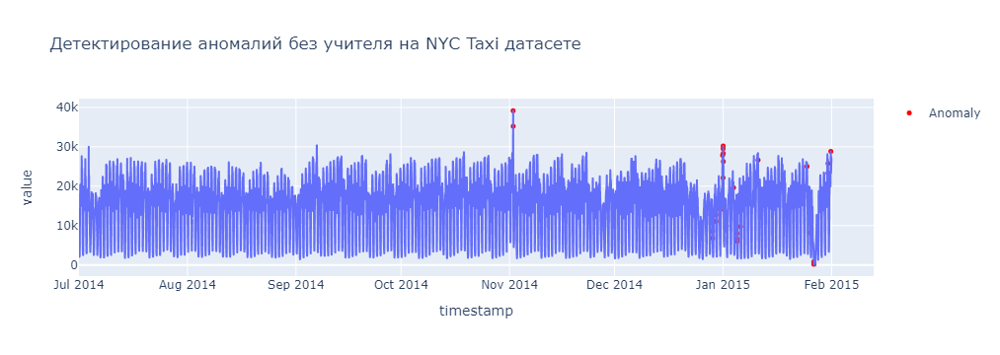

In [10]:
#смотрим на графике аномалии
import plotly.graph_objects as go
#основа графика
fig = px.line(iforest_results, x=iforest_results.index, y="value", title='Детектирование аномалий без учителя на NYC Taxi датасете')
#аномалии
outlier_dates = iforest_results[iforest_results['is_Anomaly'] == True].index
#наносим аномалии на график
y_values = [iforest_results.loc[i]['value'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=5)))
        
fig.show()

In [11]:
#выглядит очень интересно: за аномалию считается откровенный выброс 2 ноября 2014 в час ночи
#гугл показывает на эту дату хоккей, и заморозки с 8 ноября, что в целом тоже может быть выбросом
#также за выброс считается новый год, пару дней до него, и несколько точек в январе
#26-27 января тоже вполне себе аномалия с виду, она связана с заморозками, согласно гуглу

In [12]:
#данные подготовлены,теперь можно обучать модель
#явные аномалии у нас 2го ноября, плюс новый год и весь январь 2015
#модель создадим по методу автоэнкодера
import tensorflow as tf
from tensorflow.keras import Model, Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import LSTM, Dense, RepeatVector, Dropout, TimeDistributed
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split

In [13]:
#переприсвоим датафрейм, чтобы не портить исходные данные, вдруг потребуются
data = df

#удалим лишние признаки из датафрейма, эти признаки не потребуются для автоэнкодера
data = data.drop(['day', 'day_name', 'day_of_year', 'week_of_year', 'hour', 'is_weekday'], axis=1) 
data.head()

,value
timestamp,
2014-07-01 00:00:00,10844
2014-07-01 00:30:00,8127
2014-07-01 01:00:00,6210
2014-07-01 01:30:00,4656
2014-07-01 02:00:00,3820


In [15]:
#разобьем выборку на train test
period = 48 #48 измерений в день, раз в 30 мин
ratio = 0.55
train_size = int(data.shape[0] * ratio)
train = data[:train_size]
test = data[train_size:]

dates_train = data.index[:train_size]
dates_test = data.index[train_size:]

#выведем то что у нас получилось, получим трейн выборку без аномалий
print('Train size: ', ratio)

print('\n\nTRAIN SET:  from  ' + str(np.min(dates_train)) + '  to  ' +str(np.max(dates_train)))
print('Data size: ', train.shape[0])
print('Number of days: ', int(train.shape[0] / period))


print('\n\nTEST SET:  from  ' + str(np.min(dates_test)) + '  to  ' +str(np.max(dates_test)))
print('Data size: ', test.shape[0])
print('Number of days: ', int(test.shape[0] / period))

Train size:  0.55


TRAIN SET:  from  2014-07-01 00:00:00  to  2014-10-27 05:30:00
Data size:  5676
Number of days:  118


TEST SET:  from  2014-10-27 06:00:00  to  2015-01-31 23:30:00
Data size:  4644
Number of days:  96


In [16]:
#сделаем нормализацию данных
scaler = StandardScaler()
scaler = scaler.fit(train.values.reshape(-1, 1))

train = scaler.transform(train.values.reshape(-1, 1))
test = scaler.transform(test.values.reshape(-1, 1))

In [17]:
#зададим функцию для разбиения данных по окнам в один день
def split_into_windows(X, length):
    windows = []
    for start in range(0, len(X) - length + 1):
        windows.append(X[start: start + length])
    return np.array(windows)

In [18]:
#данные пишутся раз в 30 минут, соответственно за один день имеем 48 измерений
window_length = 48

X_train = split_into_windows(train, window_length)
X_test = split_into_windows(test, window_length)

_, input_length, input_dim = X_train.shape
X_train.shape

(5629, 48, 1)

In [19]:
# зададим архитектуру сетки
dim_hidden1 = 24 # 1/2 окна
dim_hidden2 = 12 # 1/4 окна

model = Sequential()
model.add(LSTM(units=dim_hidden1, activation='relu', input_shape=(input_length, input_dim), return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=dim_hidden2, activation='relu', return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=dim_hidden2, activation='relu', return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=dim_hidden1, activation='relu', return_sequences=True))
model.add(Dropout(0.2))
model.add(Dense(1))

model.compile(loss='mse', optimizer='adam')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 48, 24)            2496      
                                                                 
 dropout (Dropout)           (None, 48, 24)            0         
                                                                 
 lstm_1 (LSTM)               (None, 48, 12)            1776      
                                                                 
 dropout_1 (Dropout)         (None, 48, 12)            0         
                                                                 
 lstm_2 (LSTM)               (None, 48, 12)            1200      
                                                                 
 dropout_2 (Dropout)         (None, 48, 12)            0         
                                                                 
 lstm_3 (LSTM)               (None, 48, 24)            3

In [20]:
#зададим параметры обучения
batch_size = 48 # батч - один день
epochs = 50
validation_split = 0.3
es = EarlyStopping(monitor='val_loss', patience=10) #10 эпох без изменений - обучение остановится.

#обучение
history = model.fit(X_train, X_train, 
                batch_size = batch_size, 
                epochs = epochs, 
                validation_split = validation_split, 
                callbacks = [es])

Epoch 1/50
83/83 [==============================] - 21s 109ms/step - loss: 0.8419 - val_loss: 0.6951
Epoch 2/50
83/83 [==============================] - 7s 85ms/step - loss: 0.4483 - val_loss: 0.2765
Epoch 3/50
83/83 [==============================] - 8s 91ms/step - loss: 0.2585 - val_loss: 0.1557
Epoch 4/50
83/83 [==============================] - 8s 91ms/step - loss: 0.1769 - val_loss: 0.1099
Epoch 5/50
83/83 [==============================] - 7s 87ms/step - loss: 0.1388 - val_loss: 0.0793
Epoch 6/50
83/83 [==============================] - 8s 92ms/step - loss: 0.1164 - val_loss: 0.0685
Epoch 7/50
83/83 [==============================] - 7s 86ms/step - loss: 0.1035 - val_loss: 0.0609
Epoch 8/50
83/83 [==============================] - 8s 95ms/step - loss: 0.0927 - val_loss: 0.0545
Epoch 9/50
83/83 [==============================] - 7s 90ms/step - loss: 0.0845 - val_loss: 0.0422
Epoch 10/50
83/83 [==============================] - 8s 91ms/step - loss: 0.0783 - val_loss: 0.0348
Epoch 1

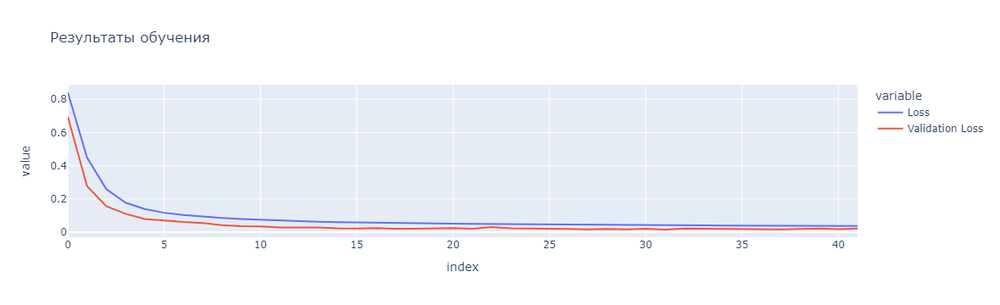

In [21]:
#строим графики по обучению
y1 = history.history['loss']
y2 = history.history['val_loss']

plot_points = pd.DataFrame(
    {'Loss': y1,
     'Validation Loss': y2
    })

fig = px.line(plot_points, y=['Loss', 'Validation Loss'], title='Результаты обучения')
fig.show()

176/176 [==============================] - 4s 23ms/step


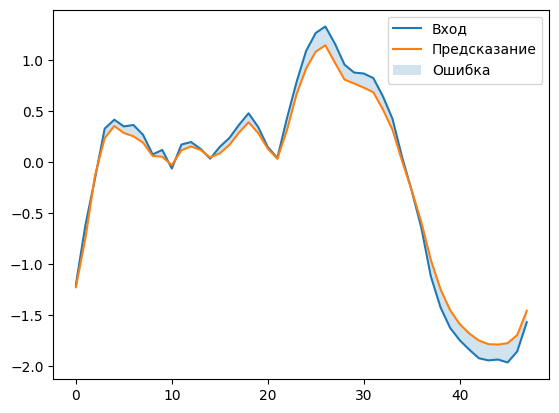

In [22]:
#делаем предикт на тестовых данных
pred_x_test = model.predict(X_test)
pred_x_train = model.predict(X_train) #и для трейн

#строим график для сравнения выхода и входа нейронки
for i in range(int(period / window_length)):
    x = X_test[i * window_length].flatten()
    x_pred = pred_x_test[i * window_length].flatten()
    
plt.plot(x, label='Вход')
plt.plot(x_pred, label='Предсказание')
plt.fill_between(np.arange(window_length), x, x_pred, alpha=0.2, label='Ошибка')
plt.legend()
plt.show()

In [23]:
#оценим ошибку входа и выхода
mse = lambda x, x_pred: np.mean(np.abs(x - x_pred)**2, axis=1)

train_mse_loss = pd.DataFrame(mse(X_train, pred_x_train), columns=['Error'])
test_mse_loss = pd.DataFrame(mse(X_test, pred_x_test), columns=['Error'])

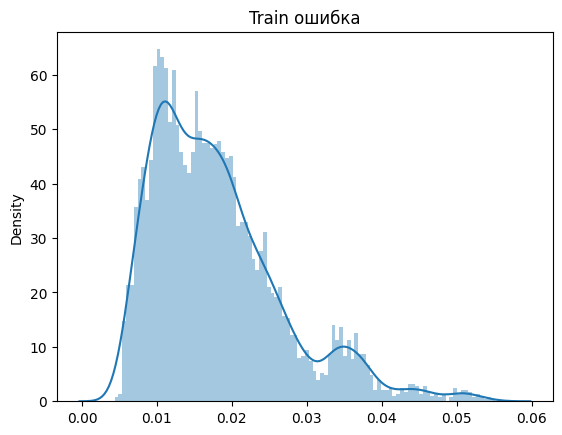

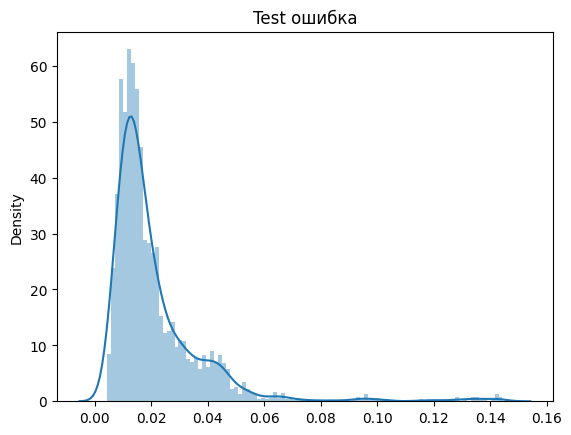

In [24]:
#построим гистограммы распределения ошибок, это поможет нам выбрать порог
plt.title('Train ошибка')
sns.distplot(train_mse_loss, bins=100, kde=True)
plt.show()

plt.title('Test ошибка')
sns.distplot(test_mse_loss, bins=100, kde=True)
plt.show()

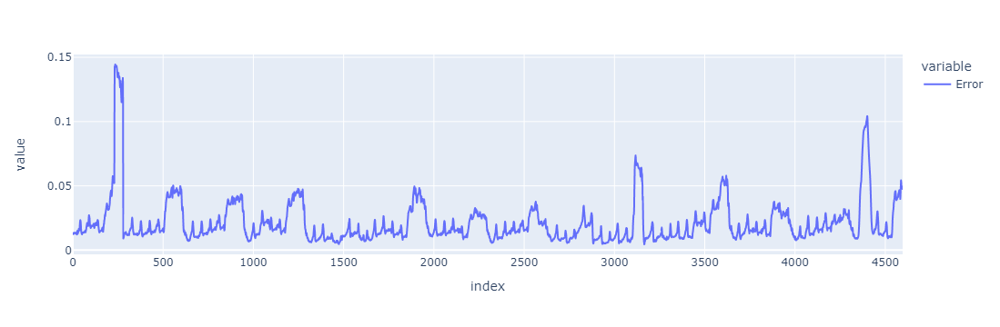

In [25]:
#построим график ошибки, что тоже поможет прикинуть порог

fig = px.line(test_mse_loss)
fig.show()

In [28]:
#и заодно прикинем возможность оценки порога через среднее и 2ско
print(np.mean(test_mse_loss)[0] + 2 * np.std(test_mse_loss)[0])

0.05688737984934383


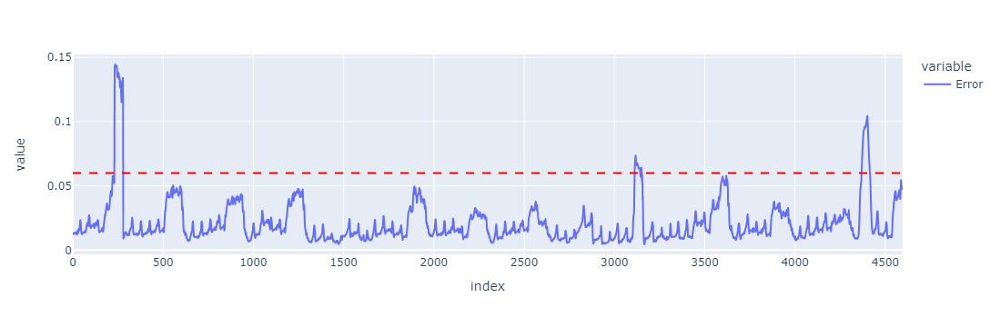

In [33]:
#исходя из данных выше, выберем порог
threshold = 0.06

#посмотрим по графикам что получилось
fig = px.line(test_mse_loss)
fig.add_hline(y=threshold, line_color='red', line_dash='dash')
fig.show()

In [34]:
#найдем даты с аномалиями
test_mse_loss_array = test_mse_loss.to_numpy().flatten()
y_pred = test_mse_loss_array >= threshold

dates_with_hours_anomalies = dates_test[:-(window_length-1)][y_pred]

print('Список дат, в которые были аномалии:')
for d in dates_with_hours_anomalies:
    print(d)

Список дат, в которые были аномалии:
2014-11-01 01:30:00
2014-11-01 02:00:00
2014-11-01 02:30:00
2014-11-01 03:00:00
2014-11-01 03:30:00
2014-11-01 04:00:00
2014-11-01 04:30:00
2014-11-01 05:00:00
2014-11-01 05:30:00
2014-11-01 06:00:00
2014-11-01 06:30:00
2014-11-01 07:00:00
2014-11-01 07:30:00
2014-11-01 08:00:00
2014-11-01 08:30:00
2014-11-01 09:00:00
2014-11-01 09:30:00
2014-11-01 10:00:00
2014-11-01 10:30:00
2014-11-01 11:00:00
2014-11-01 11:30:00
2014-11-01 12:00:00
2014-11-01 12:30:00
2014-11-01 13:00:00
2014-11-01 13:30:00
2014-11-01 14:00:00
2014-11-01 14:30:00
2014-11-01 15:00:00
2014-11-01 15:30:00
2014-11-01 16:00:00
2014-11-01 16:30:00
2014-11-01 17:00:00
2014-11-01 17:30:00
2014-11-01 18:00:00
2014-11-01 18:30:00
2014-11-01 19:00:00
2014-11-01 19:30:00
2014-11-01 20:00:00
2014-11-01 20:30:00
2014-11-01 21:00:00
2014-11-01 21:30:00
2014-11-01 22:00:00
2014-11-01 22:30:00
2014-11-01 23:00:00
2014-11-01 23:30:00
2014-11-02 00:00:00
2014-11-02 00:30:00
2014-11-02 01:00:00
201

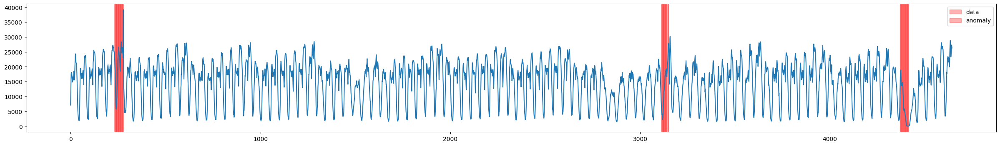

In [36]:
#посмотрим на графике
indexes = []
for d in dates_with_hours_anomalies:
    index_low = np.where(dates_test == d)
    d_temp = d  + np.timedelta64(int(window_length / 2), 'h')
    indexes.append(index_low[0][0])

plt.figure(figsize=(30,4))
for index in indexes:
    plt.axvspan(index, index, color='r', alpha=0.3)
plt.plot(scaler.inverse_transform(test).flatten())
plt.legend(['data', 'anomaly'])
plt.show()

Мы нашли:
- Марафон https://en.wikipedia.org/wiki/2014_New_York_City_Marathon
- Новый год (31 декабря)
- Метель https://en.wikipedia.org/wiki/January_2015_North_American_blizzard

Результаты частично не совпали с isolation forest, однако тоже являются аномалиями